In [1]:
# import libraries
import os
import cv2
import itertools
import numpy as np
import pandas as pd
import seaborn as sns
import tensorflow as tf
import tensorflow_hub as hub
from matplotlib import pyplot as plt
from tensorflow import keras, random
from tensorflow.keras.preprocessing.image import load_img,img_to_array
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report, recall_score, precision_score, ConfusionMatrixDisplay
from keras import layers, models, preprocessing
from keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Layer, Dense, GlobalAveragePooling2D, GlobalMaxPooling2D, Reshape, Multiply, Conv2D, Add, Activation, BatchNormalization, Dropout, Input, ReLU, DepthwiseConv2D

In [2]:
# make it reproducible
tf.keras.backend.clear_session()
seed_num = 42
tf.random.set_seed(seed_num)
tf.keras.utils.set_random_seed(seed_num)
keras.utils.set_random_seed(seed_num)

In [3]:
train_dir = "tomato_diseases/train"
test_dir = "tomato_diseases/test"

batch_size = 32
img_size = 224

In [4]:

class_names = sorted(os.listdir(train_dir))
print("Number of classes: ", len(class_names))
print("List of classes: ", class_names)

Number of classes:  10
List of classes:  ['Tomato___Bacterial_spot', 'Tomato___Early_blight', 'Tomato___Late_blight', 'Tomato___Leaf_Mold', 'Tomato___Septoria_leaf_spot', 'Tomato___Spider_mites Two-spotted_spider_mite', 'Tomato___Target_Spot', 'Tomato___Tomato_Yellow_Leaf_Curl_Virus', 'Tomato___Tomato_mosaic_virus', 'Tomato___healthy']


In [5]:
redundant_file = "/.DS_Store"
if os.path.exists(train_dir +"/"+ redundant_file):
    os.remove(train_dir +"/"+ redundant_file)
if os.path.exists(test_dir +"/"+ redundant_file):
    os.remove(test_dir +"/"+ redundant_file)

class_names = sorted(os.listdir(train_dir))
print("Number of classes: ", len(class_names))
print("List of classes: ", class_names)

Number of classes:  10
List of classes:  ['Tomato___Bacterial_spot', 'Tomato___Early_blight', 'Tomato___Late_blight', 'Tomato___Leaf_Mold', 'Tomato___Septoria_leaf_spot', 'Tomato___Spider_mites Two-spotted_spider_mite', 'Tomato___Target_Spot', 'Tomato___Tomato_Yellow_Leaf_Curl_Virus', 'Tomato___Tomato_mosaic_virus', 'Tomato___healthy']


In [6]:
nums = {}
for disease in class_names:
    nums[disease] = len(os.listdir(train_dir + '/' + disease)) + len(os.listdir(test_dir + '/' + disease))

# converting the nums dictionary to pandas dataframe passing index as plant name and number of images as column

img_per_class = pd.DataFrame(nums.values(), index=nums.keys(), columns=["no. of images"])
img_per_class

,no. of images
Tomato___Bacterial_spot,2127
Tomato___Early_blight,1000
Tomato___Late_blight,1909
Tomato___Leaf_Mold,952
Tomato___Septoria_leaf_spot,1771
Tomato___Spider_mites Two-spotted_spider_mite,1676
Tomato___Target_Spot,1404
Tomato___Tomato_Yellow_Leaf_Curl_Virus,5357
Tomato___Tomato_mosaic_virus,373
Tomato___healthy,1591


Text(0.5, 1.0, 'Images per each class of plant disease')

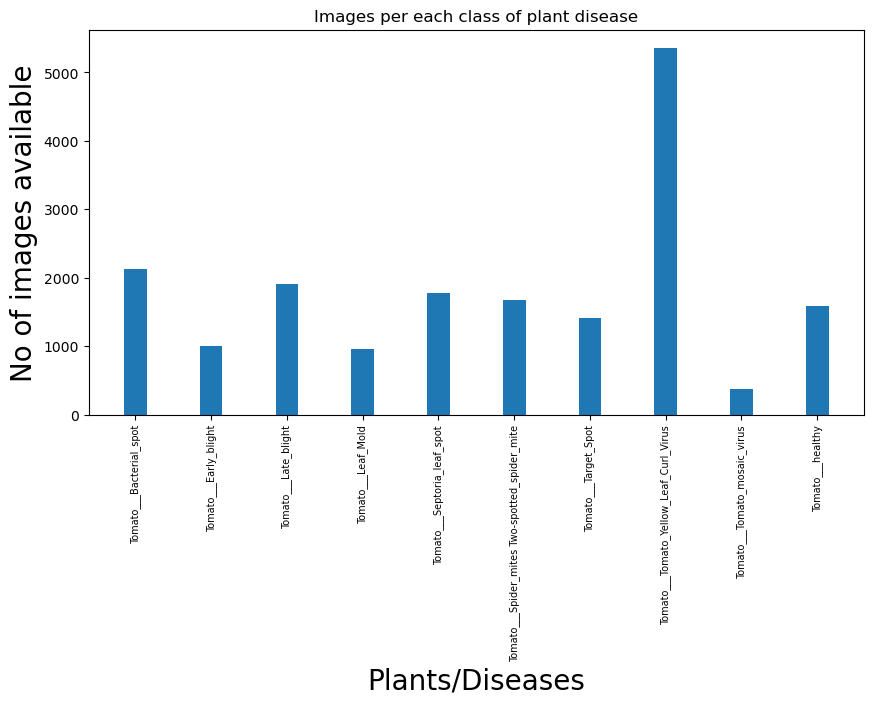

In [11]:
# plotting number of images available for each disease
index = [n for n in range(10)]
plt.figure(figsize=(10, 5))
plt.bar(index, [n for n in nums.values()], width=0.3)
plt.xlabel('Plants/Diseases', fontsize=20)
plt.ylabel('No of images available', fontsize=20)
plt.xticks(index, class_names, fontsize=7, rotation=90)
plt.title('Images per each class of plant disease')

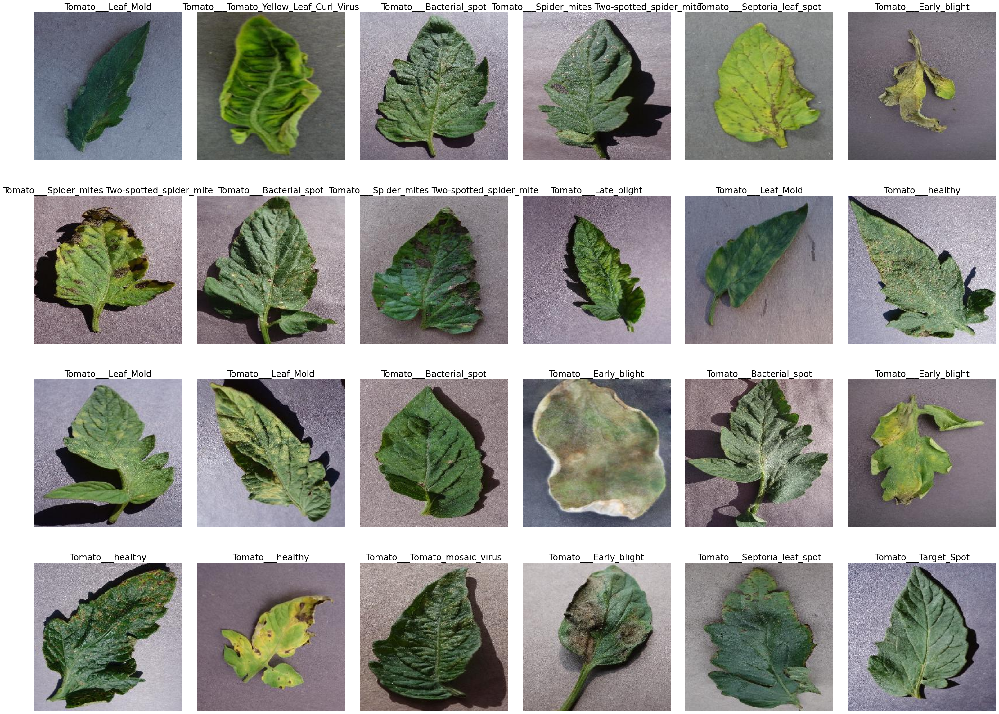

In [11]:
# Display Random Images

plt.figure(figsize=(40,30))#Set figure size to 40 inches in width and 30 inches in height
plt.subplots_adjust(wspace=0.1,hspace=0.1)# width and height space between subplots to 0.1

# Iterate over a range of 24 (to display 24 images)
for i in range(24):
    #Get a random folder index within the range of available folders in the training data
    random_folder = np.random.randint(0, len(os.listdir(train_dir)))
    #Get the path of the randomly selected folder
    random_folder_path = os.path.join(train_dir, os.listdir(train_dir)[random_folder])  
    #Get a random image index within the range of available images in the selected folder
    random_image = np.random.randint(0, len(os.listdir(random_folder_path))) 
    
    #Get the path of the randomly selected image and Read the image using OpenCV
    random_image_path = os.path.join(random_folder_path, os.listdir(random_folder_path)[random_image])  
    image = cv2.imread(random_image_path)  
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) #Convert the image from (BGR to RGB) 
    
    #Get the class name for the current image
    class_name = class_names[random_folder]  
    
    # Create a subplot with 4 rows and 6 columns, and set the current subplot index
    plt.subplot(4, 6, i + 1)  
    plt.imshow(image)#Display the image
    plt.axis("off")#Turn off the axis
    plt.title(class_name, fontsize=20)#Set the title of the subplot to the class name  
    
# Display the entire plot
plt.show()

In [8]:
# Loading data for training and testing
data_generator = ImageDataGenerator(
    rescale=1./255,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    validation_split=0.2
)

In [9]:
#

training_dataset = data_generator.flow_from_directory(
    directory=train_dir,
    target_size=(img_size, img_size),
    batch_size=batch_size,
    subset='training',
    class_mode='categorical'
)
validation_dataset = data_generator.flow_from_directory(
    directory=train_dir,
    target_size=(img_size, img_size),
    batch_size=batch_size,
    subset='validation',
    class_mode='categorical'
)

testing_dataset = data_generator.flow_from_directory(
    directory=test_dir,
    target_size=(img_size, img_size),
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=False
)

Found 11621 images belonging to 10 classes.
Found 2902 images belonging to 10 classes.
Found 3637 images belonging to 10 classes.


In [10]:
# Create a mapping from class indices to class names
class_indices = {v: k for k, v in training_dataset.class_indices.items()}
class_indices

{0: 'Tomato___Bacterial_spot',
 1: 'Tomato___Early_blight',
 2: 'Tomato___Late_blight',
 3: 'Tomato___Leaf_Mold',
 4: 'Tomato___Septoria_leaf_spot',
 5: 'Tomato___Spider_mites Two-spotted_spider_mite',
 6: 'Tomato___Target_Spot',
 7: 'Tomato___Tomato_Yellow_Leaf_Curl_Virus',
 8: 'Tomato___Tomato_mosaic_virus',
 9: 'Tomato___healthy'}

In [11]:
# for clearing order number in Layer label. use when add layer multiple time when testing.
from keras import backend as K
K.clear_session()

In [12]:
## Define the CBAM module
class ChannelAttention(Layer):
    def __init__(self, reduction_ratio=0.5):
        super(ChannelAttention, self).__init__()
        self.reduction_ratio = reduction_ratio

    def build(self, input_shape):
        self.dense_1 = Dense(int(input_shape[-1] * self.reduction_ratio), activation='relu')
        self.dense_2 = Dense(input_shape[-1])

    def call(self, inputs):
        avg_pool = GlobalAveragePooling2D()(inputs)
        max_pool = GlobalMaxPooling2D()(inputs)
        
        avg_pool = Reshape((1, 1, avg_pool.shape[-1]))(avg_pool)
        max_pool = Reshape((1, 1, max_pool.shape[-1]))(max_pool)
        
        avg_out = self.dense_1(avg_pool)
        avg_out = self.dense_2(avg_out)
        
        max_out = self.dense_1(max_pool)
        max_out = self.dense_2(max_out)
        
        out = avg_out + max_out
        out = Activation('sigmoid')(out)
        
        return Multiply()([inputs, out])

class SpatialAttention(Layer):
    def __init__(self):
        super(SpatialAttention, self).__init__()

    def build(self, input_shape):
        self.conv = Conv2D(1, kernel_size=7, padding='same', activation='sigmoid')

    def call(self, inputs):
        avg_pool = tf.reduce_mean(inputs, axis=-1, keepdims=True)
        max_pool = tf.reduce_max(inputs, axis=-1, keepdims=True)
        
        concat = tf.concat([avg_pool, max_pool], axis=-1)
        out = self.conv(concat)
        
        return Multiply()([inputs, out])

class CBAM(Layer):
    def __init__(self, reduction_ratio=0.5):
        super(CBAM, self).__init__()
        self.channel_attention = ChannelAttention(reduction_ratio)
        self.spatial_attention = SpatialAttention()

    def call(self, inputs):
        out = self.channel_attention(inputs)
        out = self.spatial_attention(out)
        return out

In [13]:
base_model = keras.applications.DenseNet121(
    input_shape=(img_size,img_size,3),
    include_top=False,
    weights='imagenet'
)
base_model.summary()

Model: "densenet121"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 zero_padding2d (ZeroPadding2D)  (None, 230, 230, 3)  0          ['input_1[0][0]']                
                                                                                                  
 conv1/conv (Conv2D)            (None, 112, 112, 64  9408        ['zero_padding2d[0][0]']         
                                )                                                                 
                                                                                        

 n)                                                                                               
                                                                                                  
 conv2_block4_1_conv (Conv2D)   (None, 56, 56, 128)  20480       ['conv2_block4_0_relu[0][0]']    
                                                                                                  
 conv2_block4_1_bn (BatchNormal  (None, 56, 56, 128)  512        ['conv2_block4_1_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv2_block4_1_relu (Activatio  (None, 56, 56, 128)  0          ['conv2_block4_1_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv2_blo

 conv3_block2_0_relu (Activatio  (None, 28, 28, 160)  0          ['conv3_block2_0_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv3_block2_1_conv (Conv2D)   (None, 28, 28, 128)  20480       ['conv3_block2_0_relu[0][0]']    
                                                                                                  
 conv3_block2_1_bn (BatchNormal  (None, 28, 28, 128)  512        ['conv3_block2_1_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv3_block2_1_relu (Activatio  (None, 28, 28, 128)  0          ['conv3_block2_1_bn[0][0]']      
 n)                                                                                               
          

                                                                                                  
 conv3_block6_1_relu (Activatio  (None, 28, 28, 128)  0          ['conv3_block6_1_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv3_block6_2_conv (Conv2D)   (None, 28, 28, 32)   36864       ['conv3_block6_1_relu[0][0]']    
                                                                                                  
 conv3_block6_concat (Concatena  (None, 28, 28, 320)  0          ['conv3_block5_concat[0][0]',    
 te)                                                              'conv3_block6_2_conv[0][0]']    
                                                                                                  
 conv3_block7_0_bn (BatchNormal  (None, 28, 28, 320)  1280       ['conv3_block6_concat[0][0]']    
 ization) 

 ate)                                                             'conv3_block10_2_conv[0][0]']   
                                                                                                  
 conv3_block11_0_bn (BatchNorma  (None, 28, 28, 448)  1792       ['conv3_block10_concat[0][0]']   
 lization)                                                                                        
                                                                                                  
 conv3_block11_0_relu (Activati  (None, 28, 28, 448)  0          ['conv3_block11_0_bn[0][0]']     
 on)                                                                                              
                                                                                                  
 conv3_block11_1_conv (Conv2D)  (None, 28, 28, 128)  57344       ['conv3_block11_0_relu[0][0]']   
                                                                                                  
 conv3_blo

 conv4_block2_concat (Concatena  (None, 14, 14, 320)  0          ['conv4_block1_concat[0][0]',    
 te)                                                              'conv4_block2_2_conv[0][0]']    
                                                                                                  
 conv4_block3_0_bn (BatchNormal  (None, 14, 14, 320)  1280       ['conv4_block2_concat[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv4_block3_0_relu (Activatio  (None, 14, 14, 320)  0          ['conv4_block3_0_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv4_block3_1_conv (Conv2D)   (None, 14, 14, 128)  40960       ['conv4_block3_0_relu[0][0]']    
          

 n)                                                                                               
                                                                                                  
 conv4_block7_1_conv (Conv2D)   (None, 14, 14, 128)  57344       ['conv4_block7_0_relu[0][0]']    
                                                                                                  
 conv4_block7_1_bn (BatchNormal  (None, 14, 14, 128)  512        ['conv4_block7_1_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv4_block7_1_relu (Activatio  (None, 14, 14, 128)  0          ['conv4_block7_1_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv4_blo

 conv4_block11_1_relu (Activati  (None, 14, 14, 128)  0          ['conv4_block11_1_bn[0][0]']     
 on)                                                                                              
                                                                                                  
 conv4_block11_2_conv (Conv2D)  (None, 14, 14, 32)   36864       ['conv4_block11_1_relu[0][0]']   
                                                                                                  
 conv4_block11_concat (Concaten  (None, 14, 14, 608)  0          ['conv4_block10_concat[0][0]',   
 ate)                                                             'conv4_block11_2_conv[0][0]']   
                                                                                                  
 conv4_block12_0_bn (BatchNorma  (None, 14, 14, 608)  2432       ['conv4_block11_concat[0][0]']   
 lization)                                                                                        
          

                                                                                                  
 conv4_block16_0_bn (BatchNorma  (None, 14, 14, 736)  2944       ['conv4_block15_concat[0][0]']   
 lization)                                                                                        
                                                                                                  
 conv4_block16_0_relu (Activati  (None, 14, 14, 736)  0          ['conv4_block16_0_bn[0][0]']     
 on)                                                                                              
                                                                                                  
 conv4_block16_1_conv (Conv2D)  (None, 14, 14, 128)  94208       ['conv4_block16_0_relu[0][0]']   
                                                                                                  
 conv4_block16_1_bn (BatchNorma  (None, 14, 14, 128)  512        ['conv4_block16_1_conv[0][0]']   
 lization)

 conv4_block20_1_conv (Conv2D)  (None, 14, 14, 128)  110592      ['conv4_block20_0_relu[0][0]']   
                                                                                                  
 conv4_block20_1_bn (BatchNorma  (None, 14, 14, 128)  512        ['conv4_block20_1_conv[0][0]']   
 lization)                                                                                        
                                                                                                  
 conv4_block20_1_relu (Activati  (None, 14, 14, 128)  0          ['conv4_block20_1_bn[0][0]']     
 on)                                                                                              
                                                                                                  
 conv4_block20_2_conv (Conv2D)  (None, 14, 14, 32)   36864       ['conv4_block20_1_relu[0][0]']   
                                                                                                  
 conv4_blo

                                                                                                  
 conv4_block24_2_conv (Conv2D)  (None, 14, 14, 32)   36864       ['conv4_block24_1_relu[0][0]']   
                                                                                                  
 conv4_block24_concat (Concaten  (None, 14, 14, 1024  0          ['conv4_block23_concat[0][0]',   
 ate)                           )                                 'conv4_block24_2_conv[0][0]']   
                                                                                                  
 pool4_bn (BatchNormalization)  (None, 14, 14, 1024  4096        ['conv4_block24_concat[0][0]']   
                                )                                                                 
                                                                                                  
 pool4_relu (Activation)        (None, 14, 14, 1024  0           ['pool4_bn[0][0]']               
          

                                                                                                  
 conv5_block4_1_relu (Activatio  (None, 7, 7, 128)   0           ['conv5_block4_1_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv5_block4_2_conv (Conv2D)   (None, 7, 7, 32)     36864       ['conv5_block4_1_relu[0][0]']    
                                                                                                  
 conv5_block4_concat (Concatena  (None, 7, 7, 640)   0           ['conv5_block3_concat[0][0]',    
 te)                                                              'conv5_block4_2_conv[0][0]']    
                                                                                                  
 conv5_block5_0_bn (BatchNormal  (None, 7, 7, 640)   2560        ['conv5_block4_concat[0][0]']    
 ization) 

 te)                                                              'conv5_block8_2_conv[0][0]']    
                                                                                                  
 conv5_block9_0_bn (BatchNormal  (None, 7, 7, 768)   3072        ['conv5_block8_concat[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv5_block9_0_relu (Activatio  (None, 7, 7, 768)   0           ['conv5_block9_0_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv5_block9_1_conv (Conv2D)   (None, 7, 7, 128)    98304       ['conv5_block9_0_relu[0][0]']    
                                                                                                  
 conv5_blo

                                                                                                  
 conv5_block13_1_conv (Conv2D)  (None, 7, 7, 128)    114688      ['conv5_block13_0_relu[0][0]']   
                                                                                                  
 conv5_block13_1_bn (BatchNorma  (None, 7, 7, 128)   512         ['conv5_block13_1_conv[0][0]']   
 lization)                                                                                        
                                                                                                  
 conv5_block13_1_relu (Activati  (None, 7, 7, 128)   0           ['conv5_block13_1_bn[0][0]']     
 on)                                                                                              
                                                                                                  
 conv5_block13_2_conv (Conv2D)  (None, 7, 7, 32)     36864       ['conv5_block13_1_relu[0][0]']   
          

In [15]:
base_model.trainable=False

In [16]:
inputs = Input(shape=(img_size, img_size, 3))

x = base_model(inputs, training=False)
x = CBAM()(x)
x = GlobalAveragePooling2D()(x)
x = Dropout(0.5)(x)
x = Dense(training_dataset.num_classes, activation='softmax')(x)

model = Model(inputs, x)

model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 densenet121 (Functional)    (None, 7, 7, 1024)        7037504   
                                                                 
 cbam (CBAM)                 (None, 7, 7, 1024)        1050211   
                                                                 
 global_average_pooling2d (G  (None, 1024)             0         
 lobalAveragePooling2D)                                          
                                                                 
 dropout (Dropout)           (None, 1024)              0         
                                                                 
 dense (Dense)               (None, 10)                10250     
                                                             

In [17]:
# training
model.compile(
    optimizer = 'adam',
    loss = 'categorical_crossentropy',
    metrics = ['accuracy']
)
result_model = model.fit(
    training_dataset,
    validation_data=validation_dataset,
    epochs=30,
    callbacks=[
        tf.keras.callbacks.EarlyStopping(
            monitor='val_accuracy',
            patience=5,
            restore_best_weights=True
        )
    ]
)

Epoch 1/30


2024-07-23 15:10:24.315334: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]
2024-07-23 15:10:24.344965: W tensorflow/tsl/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz


364/364 [==============================] - ETA: 0s - loss: 0.9810 - accuracy: 0.6644

2024-07-23 15:15:03.386682: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]


364/364 [==============================] - 351s 958ms/step - loss: 0.9810 - accuracy: 0.6644 - val_loss: 0.5038 - val_accuracy: 0.8236
Epoch 2/30
364/364 [==============================] - 361s 992ms/step - loss: 0.4706 - accuracy: 0.8403 - val_loss: 0.3860 - val_accuracy: 0.8732
Epoch 3/30
364/364 [==============================] - 365s 1s/step - loss: 0.3700 - accuracy: 0.8742 - val_loss: 0.3824 - val_accuracy: 0.8680
Epoch 4/30
364/364 [==============================] - 360s 988ms/step - loss: 0.3200 - accuracy: 0.8931 - val_loss: 0.3324 - val_accuracy: 0.8815
Epoch 5/30
364/364 [==============================] - 353s 970ms/step - loss: 0.2915 - accuracy: 0.9012 - val_loss: 0.2643 - val_accuracy: 0.9049
Epoch 6/30
364/364 [==============================] - 358s 983ms/step - loss: 0.2521 - accuracy: 0.9127 - val_loss: 0.2321 - val_accuracy: 0.9221
Epoch 7/30
364/364 [==============================] - 355s 974ms/step - loss: 0.2344 - accuracy: 0.9198 - val_loss: 0.3905 - val_accuracy:

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



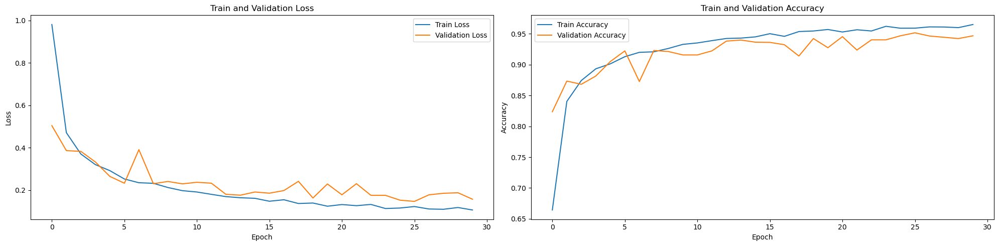

In [18]:
# Accuracy plot
plt.figure(figsize = (20,5))
plt.subplot(1,2,2)
plt.title("Train and Validation Accuracy")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.plot(result_model.history['accuracy'], label="Train Accuracy")
plt.plot(result_model.history['val_accuracy'], label="Validation Accuracy")
plt.legend()

# Loss plot
plt.subplot(1,2,1)
plt.title("Train and Validation Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.plot(result_model.history['loss'],label="Train Loss")
plt.plot(result_model.history['val_loss'], label="Validation Loss")
plt.legend()
plt.tight_layout()

In [19]:
# Predict labels for the test data
predictions = model.predict(testing_dataset)
predicted_labels = np.argmax(predictions, axis=1)

# Get the true labels for the test data
true_labels = testing_dataset.classes

print(predicted_labels)
print(true_labels)

2024-07-23 17:57:01.532565: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]


114/114 [==============================] - 74s 645ms/step
[0 0 0 ... 9 9 9]
[0 0 0 ... 9 9 9]


In [20]:
# Model Evaluation with new test data
print("Evaluating model...")
test_loss, test_accuracy = model.evaluate(testing_dataset)
print(f"Test Accuracy: {test_accuracy * 100:.2f}%")

Evaluating model...


2024-07-23 17:58:16.054602: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]


114/114 [==============================] - 77s 676ms/step - loss: 0.1830 - accuracy: 0.9414
Test Accuracy: 94.14%


In [21]:
# Display the model's performance

#Train Accuracy: retrieves the last recorded training accuracy from the training history
print("Train Accuracy: {:.2f} %".format(result_model.history['accuracy'][-1]*100))

#Test Accuracy: computes accuracy score by comparing true labels with predicted labels
print("Test Accuracy: {:.2f} %".format(accuracy_score(true_labels, predicted_labels) * 100))

#Precision Score: computes the precision score using the micro averaging strategy.
print("Precision Score: {:.2f} %".format(precision_score(true_labels, predicted_labels, average='macro',zero_division=1) * 100))

#Recall Score: computes the recall score using the micro averaging strategy
print("Recall Score: {:.2f} %".format(recall_score(true_labels, predicted_labels, average='macro',zero_division=1) * 100))

Train Accuracy: 96.49 %
Test Accuracy: 94.53 %
Precision Score: 92.20 %
Recall Score: 93.11 %


<Figure size 2000x500 with 0 Axes>

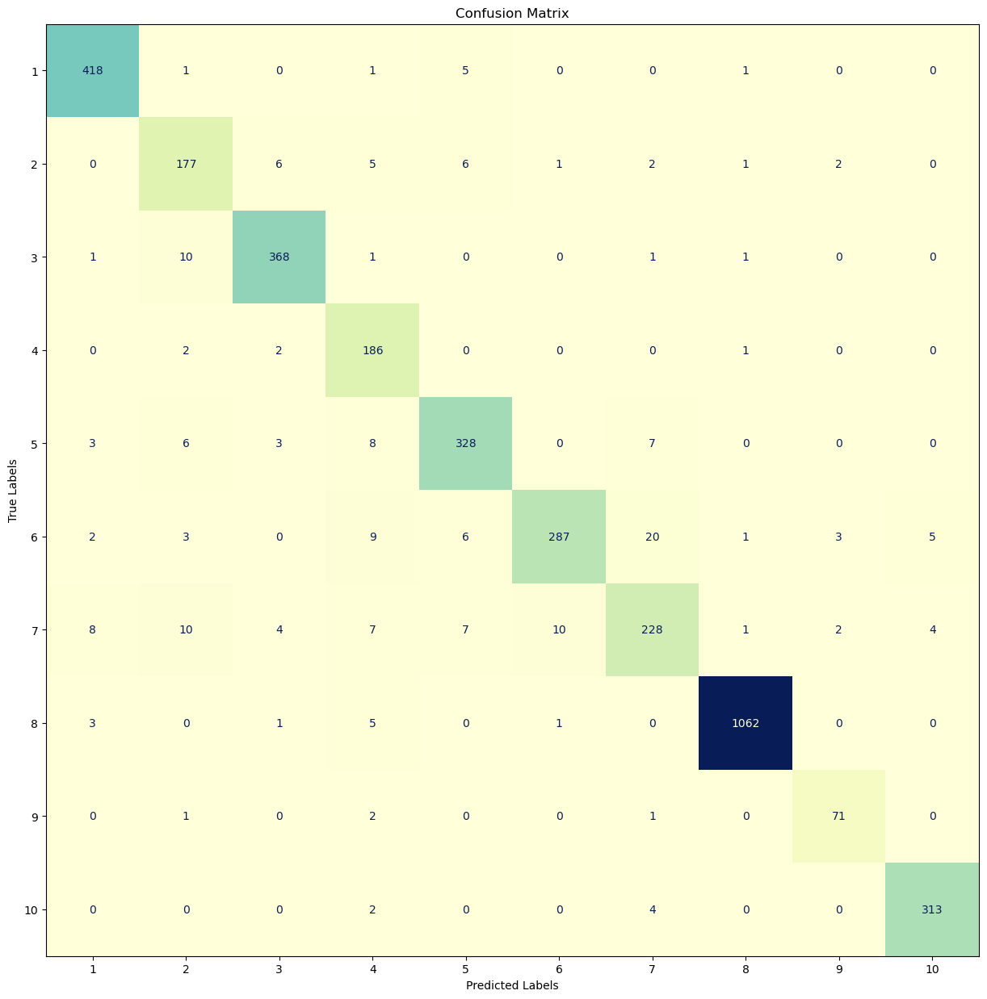

In [22]:
# Plot a confusion matrix
plt.figure(figsize= (20,5))
cm = confusion_matrix(true_labels, predicted_labels)
disp = ConfusionMatrixDisplay(confusion_matrix=cm,
                              display_labels=list(range(1,len(class_names)+1)))
fig, ax = plt.subplots(figsize=(15,15))
disp.plot(ax=ax,colorbar= False,cmap = 'YlGnBu')
plt.title("Confusion Matrix")
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

In [23]:
# Save Model (in .tflite)
converter = tf.lite.TFLiteConverter.from_keras_model(model)
tflite_model = converter.convert()

with open("tomato_model.tflite", 'wb') as f:
    f.write(tflite_model)

2024-07-23 20:58:20.573562: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'inputs' with dtype float and shape [?,7,7,1024]
	 [[{{node inputs}}]]
2024-07-23 20:58:20.576128: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'inputs' with dtype float and shape [?,1024]
	 [[{{node inputs}}]]
2024-07-23 20:58:23.046944: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'inputs' with dtype float and shape [?,7,7,1024]
	 [[{{node inputs}}]]
2024-

INFO:tensorflow:Assets written to: /var/folders/qf/mshwx5cd0yx8k5g7rzghmbsc0000gp/T/tmpb_hrpn1i/assets


INFO:tensorflow:Assets written to: /var/folders/qf/mshwx5cd0yx8k5g7rzghmbsc0000gp/T/tmpb_hrpn1i/assets
2024-07-23 20:58:41.447948: W tensorflow/compiler/mlir/lite/python/tf_tfl_flatbuffer_helpers.cc:364] Ignored output_format.
2024-07-23 20:58:41.448254: W tensorflow/compiler/mlir/lite/python/tf_tfl_flatbuffer_helpers.cc:367] Ignored drop_control_dependency.
2024-07-23 20:58:41.451207: I tensorflow/cc/saved_model/reader.cc:45] Reading SavedModel from: /var/folders/qf/mshwx5cd0yx8k5g7rzghmbsc0000gp/T/tmpb_hrpn1i
2024-07-23 20:58:41.486542: I tensorflow/cc/saved_model/reader.cc:89] Reading meta graph with tags { serve }
2024-07-23 20:58:41.486557: I tensorflow/cc/saved_model/reader.cc:130] Reading SavedModel debug info (if present) from: /var/folders/qf/mshwx5cd0yx8k5g7rzghmbsc0000gp/T/tmpb_hrpn1i
2024-07-23 20:58:41.601520: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:353] MLIR V1 optimization pass is not enabled
2024-07-23 20:58:41.623730: I tensorflow/cc/saved_model/load

In [21]:
def output(location):
    img=load_img(location,target_size=(224,224,3))
    img=img_to_array(img)
    img=img/255
    img=np.expand_dims(img,[0])
    answer=model.predict(img)
    y_class = answer.argmax(axis=-1)
    y = " ".join(str(x) for x in y_class)
    y = int(y)
    res = class_names[y]
    return res

In [22]:
img = output('/Users/theDanielIbeh/Desktop/sample_images/tomato_mosaic_virus.jpeg')
img

1/1 [==============================] - 0s 375ms/step


'Tomato___Tomato_Yellow_Leaf_Curl_Virus'